# The Impact of Covid-19 on International Aviation Activity
Members: Haoyang Chen, Zehan Ruan, Wantong Zhang

Student numbers: 5707587, 5831261, 5594634

## Contribution Statement    

Author 1: Background research, conceptual design, dataset selection and cleaning, density heatmap

Author 2: Data manipulation, dataset cleaning, processing and analysis, report writing

Author 3: Data modelling, report writing, network centrality analysis and mapping

## 1. Introduction
The international aviation industry is greatly affected by the Covid-19 pandemic. This is due to both the travel restrictions and decimation in demand of travellers. Early March 2020 saw about 10% of all flights cancelled compared to 2019. As the pandemic progressed, 40–60% fewer flight movements were recorded in late March with international flights affected the most. By April 2020, over 80% flight movements were restricted across all regions. (source: [_aislelabs_](https://www.aislelabs.com/blog/2020/03/27/how-airports-globally-are-responding-to-coronavirus-updated-frequently/))

It is interesting to analyse how the global airport network is affected by the pandemic.

The objective of the research could be achieved by answering the main research question:

*“How does the Covid-19 pandemic affect the indicators of the global aviation network?”*

The main research question could be jointly answered by the sub-questions:
1. Which indicators should be taken into account?
2. When could the significant fluctuation of these indicators be observed? 
3. How does each specific indicator affected by the pandemic?
4. Does the pandemic have the same effect on some of the indicators?

The first subquestion could be answered first, the number of flights in each airport will give an intuitive overview of the data. And some important time periods could be found in it. After that, the network layout and the network indicators are useful to analyze a network.

In the following sections, firstly, the selection and cleaning of the data is discussed in section 2. Secondly, the change of the number of flights is discussed in section 3. Thirdly, the network centrality analysis is discussed in section 4. Finally, a conclusion is given in section 5.

## 2. Data processing

In [22]:
import pandas as pd
import plotly.express as px
import matplotlib.pyplot as plt
import plotly
import networkx as nx
import numpy as np
import matplotlib as mpl

### 2.1 Data selection
Flight data around the world between Oct. 2019 and Oct. 2021 is taken into account to cover the data before the Covid-19 pandemic, during the pandemic and recovering from the pandemic.
Two databases are chosen:
- [OpenSky COVID-19 Flight Dataset](https://opensky-network.org/community/blog/item/6-opensky-covid-19-flight-dataset)    
  The dataset is collected based on the ADS-B-equipped aircraft within their coverage and contains attributes like callsign, registration, origin, destination, real-time altitude and latitude and longitude when the flight is running. Note that the dataset did not include all the flights around the world, so the result of the analysis may not be so accurate and exactly in line with reality. For example, much flight data in east Asia and especially in China is not included in the dataset.
- [World airport data](https://hub.arcgis.com/datasets/schools-BE::world-airports/about)    
  This dataset contains large, medium and small airports of the world with informations about codenames, elevation, locations, runways and so on. The date of the information is 11/04/2018.
  
The data being used is downloaded from the data base mentioned above and saved as csv. files.

- Flight data: csv. files seperated monthly with columns of callsign, ICAO24 code, typecode, origin, destination, firstseentime, lastseentime, day, altitude, latitude, longitude. What we really need is callsign, origin, destination and daytime. What's more, there are some flights with only origin or destination, or their origin and destination are the same. For data cleanning, we need to delete these rows.
- Airport data: One csv. file, with location information, names, countries and regions, idents, radio frequency of the airports.

### 2.2 Data cleaning
After selecting the data base, some data cleaning work is done. 

For now the data from OCT.2019 to Oct.2021 contains columns 'callsign', 'number', 'icao24', 'registration', 'typecode', 'origin', 'destination', 'firstseen', 'lastseen', 'day', 'latitude_1', 'longtitude_1', 'altitude_1', 'latitude_2', 'longtitude_2' and 'altitude_2'.

Considering the research questions, only the 'callsign', 'origin', 'destination' and 'day' columns are used, and the irrelevant columns are dropped. 
- 'Callsign': Each flight has a specific callsign and it is later used to count the number of flights.
- 'Origin': The departure airport of each flight.
- 'Destination': The destination airport of each light.
- 'Day': The depature day of each flight.

The lines with empty values and the data of flights with same origin and destination are dropped. At last, the selected data of all months are merged in a new data frame( [*flightdata.csv*](https://drive.google.com/file/d/1LCEDF4fWKf24v6lxzKHSxgiF5rQWQWGm/view?usp=share_link) (the file is beyong the maximum limit of github so here we upload it to google drive), which includes 28,996,563 lines of data.

## 3. Number of flights in airports
In this section, the dynamic trends of number of flights of different continents are counted and analysed. And a heatmap is produced to show the spatial visualization of the flight data.

### 3.1 Dynamic trends
By studying the origin data base, it is found that the top airports with the most departing and arriving flights don't vary much. So to simplify the problem, the airports are chosen based on the number of departing flights.
The global airports are divided to five areas: Europe, Middle East, America without US, the US and Asia-Pacific area. For each area the top two to five airports with the most departing flights are taken into account. 

The process of selecting airports is concluded in another python file. Here we upload the data processing file in the github link: [_the python file of Airport-data-process_](https://github.com/Eternalmoon04/TIL6022-LabAssignments/blob/teamassignment/assignment/data_process_1111.ipynb). And in the 3rd section we only upload images of the figures.

The selected airports of each continent are listed below:
1. Europe: EHAM, EDDF, LFPG, EGLL, LEMD
2. Middle East: OMDB, OTHH
3. America without US: CYYZ, PANC, CYVR, CYUL
4. US: KORD, KATL, KDFW, KDEN, KLAX
5. Asia-Pacific area: NZAA, RCTP, RJTT, VHHH, VIDP, WSSS, YSSY

In [23]:
#data about 201910-202110
fd = pd.read_csv('flightdata.csv')
print(len(fd))
fd.head()

28996563


,callsign,origin,destination,day
0,CES597,YBBN,CYVR,2019-10-01 00:00:00+00:00
1,ETH3640,VHHH,EBMB,2019-10-01 00:00:00+00:00
2,ETH628,KEWR,VTBS,2019-10-01 00:00:00+00:00
3,AMX023,SAEZ,LEMD,2019-10-01 00:00:00+00:00
4,RAM208,SBGR,CYUL,2019-10-01 00:00:00+00:00


In [24]:
fd_world = fd[ #Middle East
           (fd['origin'] == 'OMDB') |
           (fd['origin'] == 'OTHH') |
           # Europe 
           (fd['origin'] == 'EHAM') |
           (fd['origin'] == 'EDDF') |
           (fd['origin'] == 'LFPG') |
           (fd['origin'] == 'EGLL') |
           (fd['origin'] == 'LEMD') |
           #America without US
           (fd['origin'] == 'CYYZ') |
           (fd['origin'] == 'PANC') |
           (fd['origin'] == 'CYVR') |
           (fd['origin'] == 'CYUL') |
           #US
           (fd['origin'] == 'KORD') |
           (fd['origin'] == 'KATL') |
           (fd['origin'] == 'KDFW') |
           (fd['origin'] == 'KDEN') |
           (fd['origin'] == 'KLAX') |
           #austria
           (fd['origin'] == 'YSSY') |
           (fd['origin'] == 'NZAA') |
           #asia
           (fd['origin'] == 'VHHH') |
           (fd['origin'] == 'VIDP') |
           (fd['origin'] == 'RJTT') |
           (fd['origin'] == 'RCTP') |
           (fd['origin'] == 'WSSS') ]
fd_world.head()

,callsign,origin,destination,day
1,ETH3640,VHHH,EBMB,2019-10-01 00:00:00+00:00
6,QFA7554,KORD,YMML,2019-10-01 00:00:00+00:00
7,HVN55,YSSY,EGLL,2019-10-01 00:00:00+00:00
9,GES061K,YSSY,LEBL,2019-10-01 00:00:00+00:00
10,UAE9252,KORD,YSSY,2019-10-01 00:00:00+00:00


In [25]:
fd_group = fd_world.groupby(['origin', 'day'], as_index=False).count()
fig = px.line(fd_group , x="day", y="callsign", color="origin")
fig.update_xaxes(title={'text': 'Time'})
fig.update_yaxes(title={'text': 'Number of flights'})
fig.show()

<center>Figure 3-1 Selected Airports Around the World</center>

For further information of airports:

- Europe:
[    EDDF: Frankfurt Airport, Germany
    EGLL: Heathrow Airport, the UK
    EHAM: Amsterdam Airport Schiphol, the Netherlands
    LEMD: Madrid–Barajas Airport, Spain
    LFPG: Charles de Gaulle Airport, France]

- Middle East:
[    OMDB: Dubai International Airport, United Arab Emirates 
    OTHH: Hamad International Airport, Qatar]

- America without US:
[    CYUL: Montréal–Trudeau International Airport, Canada
    CYVR: Vancouver International Airport, Canada
    CYYC: Calgary International Airport, Canada
    PANC: Ted Stevens Anchorage International Airport, America]

- US:
[    KATL: Hartsfield–Jackson Atlanta International Airport
    KDEN: Denver International Airport
    KDFW: Dallas-Fort Worth International Airport
    KLAX: Los Angeles International Airport
    KORD: O'Hare International Airport]
    
- Asia-Pacific area:
[    NZAA: Auckland Airport, the New Zealand
    RCTP: Taiwan Taoyuan International Airport, Taiwan
    RJTT: Haneda Airport, Japan
    VHHH: Hong Kong International Airport, Hongkong
    VIDP: Indira Gandhi International Airport, India
    WSSS: Changi Airport, Singapore
    YSSY: Sydney Airport, Australia]

#### 3.1.1 For Europe: 
The five major European airports show the same overall trend. It shows a significant decreasing trend in mid-March 2020, a gradual recovery after April 2020, a slight fluctuation in November 2020 when it reaches almost 50% of the original figure, and a continued upward trend in April 2021, returning to approximately 3/4 of the original figure in 2021. And that is the typical trend of most selected airports.

![figure 3-2 europe-airport](https://github.com/Eternalmoon04/TIL6022-LabAssignments/blob/teamassignment/assignment/html%20and%20jpg%20outputs/figure%203-2%20europe.png?raw=true)
<center>Figure 3-2 Airports in Europe</center>

Since the overall European airports are trending similarly, the passenger traffic for each airport is summed and plotted from October 2019 to October 2021. It can be seen that in April 2020 (the lowest point) overall European passenger traffic was only 10% of October 2019, recovering to about 40% of its original level in 2020, dropping slightly at the end of 2020 and in the spring of 2021, and gradually picking up after the spring, finally recovering to about 70% of its original level by October 2021.

![figure 3-3 europe-total](https://github.com/Eternalmoon04/TIL6022-LabAssignments/blob/teamassignment/assignment/html%20and%20jpg%20outputs/figure%203-3%20europe%20total.png?raw=true)
<center>Figure 3-3 Total volume of European airports</center>

According to [_COVID-19: Temporary Restriction on Non-Essential Travel to the EU_](https://eur-lex.europa.eu/legal-content/EN/TXT/?uri=CELEX%3A52020DC0115), a temporary restriction of non-essential travel from third countries into the EU+ area was adopted on 16th March, which led to the changes in March in all five airports. Also in the notice, it mentioned the restriction should apply for 30 days, which is in accordance with the gradual increasing trend in April.

About another boosting increasing trend in July, there were some presses related to this change. On 30th June, [_Council agrees to start lifting travel restrictions for residents of some third countries_](https://www.consilium.europa.eu/en/press/press-releases/2020/06/30/council-agrees-to-start-lifting-travel-restrictions-for-residents-of-some-third-countries/), the recommendation of starting lifting the travel restrictions at the external borders for residents of the several third countries from 1 July was lied down. And a month later, the Council [_updated_](https://www.consilium.europa.eu/en/press/press-releases/2020/07/30/travel-restrictions-council-reviews-the-list-of-countries-for-which-member-states-should-gradually-lift-travel-restrictions-at-the-external-border/) the list of countries for which travel restrictions should be lifted and also it was mentioned that the list will continue to be reviewed and updated regularly. Thereafter, the flight volume returned to about 50% of before-covid level.

#### 3.1.2 For Middle East: 
The airports show a clear downward trend at March 2020 and gradually rebound after April 2020. The comparison shows that the changing trend of OTHH is much more moderate than that of OMDB, and OTHH has almost regained its original traffic in October 2021, while OMDB has only rebounded to 1/2 to 2/3 of its original level.

![figure 3-4 middle-east](https://github.com/Eternalmoon04/TIL6022-LabAssignments/blob/teamassignment/assignment/html%20and%20jpg%20outputs/figure%203-4%20middle%20east.png?raw=true)
<center>Figure 3-4 Airports in Middle East</center>

#### 3.1.3 For America without US:
The overall change in airport traffic in the Americas also experienced a significant decline in March 2020 and rebounded in April, and did not return to pre-epidemic airport traffic levels in October 2021.

The most significant trend in the change in CYYC is the drop to about 10% of the original level in April 2020, recovering to only 25% of the original level in the first half of CY21, but recovering from 25% to 75% within July to October 2021. The change in PANC, on the other hand, is extremely smooth and hardly affected by the epidemic.

![figure 3-5 America without US](https://github.com/Eternalmoon04/TIL6022-LabAssignments/blob/teamassignment/assignment/html%20and%20jpg%20outputs/figure%203-5%20america%20without%20US.png?raw=true)
<center>Figure 3-5 Airports in America Without the US</center>

Canadians were advised to avoid non-essential travel on 13 March 2020, while Canadian border was closed except for Canadian citizens and permanent residents on 16 March (Canada–United States border closed later on 18 March). These [_decisions and policies_](https://edmontonjournal.com/news/national/the-road-to-canadas-covid-19-outbreak-pt-3-timeline-of-federal-government-failure-at-border-to-slow-the-virus/) directly and greatly influenced the flight volume and therefore the number of flights of airport CYUL & CYVR & CYYC experienced same drop in mid March. Essential travel is exempted, and international travellers must enter through Calgary International Airport (CYYC), Vancouver International Airport (CYVR), Toronto Pearson International Airport, or Montréal–Trudeau International Airport(CYUL) with [_mandatory 14 days' quarantine_](https://www.canada.ca/en/public-health/services/diseases/2019-novel-coronavirus-infection/canadas-reponse.html). The border closure has been extended multiple times and remained closed until at [_least 21 August_](https://www.ctvnews.ca/politics/pm-trudeau-confirms-canada-u-s-border-closure-extending-to-aug-21-1.5027167). From figure 3-5 it can be seen the flight volume has had very slow recovery compared to the flights of Europe.

#### 3.1.4 For the US:
The trend is similar for every airport in the U.S.: a significant drop in airport traffic occurs in mid-March 2020, with a gradual rebound starting at the end of April. And more unlike other regions, all U.S. airports show a steady overall increase from May 2020 to October 2021, with no major ups and downs.

![figure 3-6 the US](https://github.com/Eternalmoon04/TIL6022-LabAssignments/blob/teamassignment/assignment/html%20and%20jpg%20outputs/figure%203-6%20america.png?raw=true)
<center>Figure 3-6 Airports in the US</center>

Due to the uniformity of the overall trend, the traffic at each airport was summed and line charted in the same way as the overall trend treatment for Europe to better show the trend. It can be obtained that: passenger traffic at US airports drops to 25% of the original original figure in March 2020, recovers to 50% from the end of April to July 2020 and returns to 90% of the original traffic in October 2021.

![figure 3-7 the US](https://github.com/Eternalmoon04/TIL6022-LabAssignments/blob/teamassignment/assignment/html%20and%20jpg%20outputs/figure%203-7%20amercia%20total.png?raw=true)
<center>Figure 3-7 Total Volume of American flights</center>

[_From the beginning of the pandemic and into 2021_](https://edition.cnn.com/2021/07/21/politics/us-canada-mexico-travel/index.html), the northern and southern borders have remained closed to non-essential travel by people who are neither U.S. citizens nor permanent residents. From the declaration of the public health emergency on 31 January 2020, people other than U.S. citizens, permanent residents, and their immediate family were prohibited from entering the U.S. within 14 days of being in China. This directly infulenced all the airports of the US.

#### 3.1.5 For Asia-Pacific area:
The airport situation in Asia is the most special and complicated among several regions, which may due to the fact that the first outbreak of the covid-19 was in Asia and the dense population in Asia.

Asia's airports experienced a significant drop in traffic as early as February 2020 and began to recover significantly from May 2020 at the latest. It is also worth noting that VHHH airports had almost close to 0 airport traffic in September and October. Significant traffic declines at Asian airports occurred at different time stages such as July 2020, November 2020, January 2021, and June 2021, respectively.

![figure 3-8 ASIA-PACIFIC](https://github.com/Eternalmoon04/TIL6022-LabAssignments/blob/teamassignment/assignment/html%20and%20jpg%20outputs/figure%203-8%20asia-pacific.png?raw=true)
<center>Figure 3-8 Airport in Asia-Pacific</center>

- Taiwan:
RCTP's flight volume greatly dropped from late January to early April. This is due to [_the decision_](https://www.boca.gov.tw/cp-220-5118-dc513-2.html) announce in February that flights from certain airports to be suspended and restrictions on direct flights to and from China, Hong Kong and Macau. From March 24, 2020 to June 24, 2020, [_a total ban_](https://zh.wikipedia.org/zh-cn/%E8%87%BA%E7%81%A3%E5%B0%8D%E5%9A%B4%E9%87%8D%E7%89%B9%E6%AE%8A%E5%82%B3%E6%9F%93%E6%80%A7%E8%82%BA%E7%82%8E%E7%96%AB%E6%83%85%E7%9A%84%E9%82%8A%E5%A2%83%E7%AE%A1%E5%88%B6) on passengers boarding into Taiwan. On 31th December, in principle, foreign nationals are [_temporarily prohibited_](https://web.archive.org/web/20210519121917/https://www.worldjournal.com/wj/story/121519/5136327) from entering Taiwan. However, foreign nationals who have a residence permit in Taiwan were still allowed to enter the country, or spouses and minor children of R.O.C. nationals and holders of R.O.C. residence permits, as well as job seekers, may apply for special entry permits with the appropriate documents.

- Japan:
Effective 28 December 2020, Japan [_closed its borders_](https://news.yahoo.com/japan-closes-borders-limits-travel-124507149.html?guccounter=1&guce_referrer=aHR0cHM6Ly9lbi53aWtpcGVkaWEub3JnLw&guce_referrer_sig=AQAAAB4FZTXZtWfigAOctahi5UzF_ZWg-3loiHFZATu3pI4sdccWCoF5bc8XPT87FZDKkJ4_T8EpmQNsZc3f4otJa1EXrzb-eDNW3wrzYGWc6RXQCkKfhkp44AxtpHoDdjlEMXxBl5yfxs3DmJDG25_vUH9CVjNkpFpZC5be7g1yXmx5) to all non-residents. As the result, the volume of RJTT dropped greatly on the exactly same day.

- India:
Flights to India [_were suspended on March 2020_](https://www.indiatoday.in/india/story/govt-mha-issues-detailed-guidelines-on-lockdown-1667092-2020-04-15) until further notice. This does not apply to flights that carry goods for trade or essential goods and supplies, and their crew members, helpers, cleaners, etc. As the result, the flight volume of VIDP dropped significantly in late March.

- Hongkong:
The flight volume of VHHH dropped gradually from Februray due to the travel restrictions of mainland China. Then the airport [_closed its borders_](https://www.reuters.com/article/us-health-coronavirus-hongkong/hong-kong-to-ban-all-tourist-arrivals-weighs-halt-of-alcohol-in-bars-idUSKBN21A11O) to all non-residents on 24 March 2020. Non-Hong Kong residents arriving from mainland China, Macau and Taiwan who had not been in any overseas countries/territories in the past 14 days [_were exempted from the ban_](https://www.info.gov.hk/gia/general/202003/24/P2020032400050.htm), but they were still subject to compulsory quarantine for 14 days same as all other arrivals to Hong Kong. Effective 25 March 2020, all persons arriving in Hong Kong, regardless of whether they are Hong Kong residents, were subject to compulsory quarantine. As the result, the flight volume of VHHH decreased greatly due to its own restriction and reached about 1/3 of original flight volume.

Among these airports, except for RJTT airport which has almost recovered its original traffic since October 2021, the recovery of passenger traffic at all other airports is not optimistic.

### 3.2 Density heatmap

A rasterized spatial visualization of the departing flights is shown in Figure 3-9 below using the [keplergl](https://kepler.gl/). The color shows the average departing flight per month, and the height shows the total number of the flights departing from a specific airport during the whole time period.

The [_python file for producing heatmap_](https://github.com/Eternalmoon04/TIL6022-LabAssignments/blob/teamassignment/assignment/heatmap.ipynb) is uploaded in the github link, and only figures are used in this section.
For some reason [the keplergl result](https://github.com/Eternalmoon04/TIL6022-LabAssignments/blob/teamassignment/assignment/html%20and%20jpg%20outputs/keplermap.html) can be displayed in the jupyter notebook in vscode but not on the website localhost, so it is shown in html format. The link and schematic diagram is given here. The keplergl map gives a view of interactive spatial visualization of flight data.    

![keplermap](https://github.com/Eternalmoon04/TIL6022-LabAssignments/blob/teamassignment/assignment/html%20and%20jpg%20outputs/keplermap.jpg?raw=true)
<center>Figure 3-9 The schematic diagram of keplergl</center>

The density of points, also known as the distribution of grids, is significantly high in North America and West Europe. Aviation activity in these areas are not only restricted to the major hubs but many small airports also undertake different levels and types of aviation tasks.     
    
In Asia-Pacific and Middle-East regions, flights show a significant trend toward hub airports. However, hubs in the US also carry obviously more flights than hubs in other regions, which is consistent with the conclusions above.

In [46]:
dfmerge = pd.read_csv('Heatmap.csv')
dfkepler = pd.DataFrame(dfmerge, columns=['key_0','latitude_deg','longitude_deg','origin','month'])
dfkepler.columns = ['airport','Lat','Lng','amount','month']

In [47]:
# add density heatmap using plotly express
fig = px.density_mapbox(dfmerge, lat='latitude_deg', lon='longitude_deg', z='origin', title='Airports heatmap',radius=7,
center=dict(lat=20, lon=15), zoom=1, mapbox_style='open-street-map', width=1000, height=800, animation_frame='month', range_color=(0,10000)
,color_continuous_scale='ice')
fig.update_layout(margin={})
fig.show()

<center>Figure 3-10 The Density Heatmap</center>
**The density heatmap made by plotly express shows the animated change of aviation activities around the world.**    
    
There was a sudden drop of aviation activity in March 2020 when the covid virus began to spread around the world. In April 2022 aviation activity around the world dropped to a very low level except some airports in the US, and from the flight data it was found that these airports were more likely to undertake freight tasks, so they were not influenced so much. After that, world aviation activity gradually resumed, but suffered another blow in early 2021 due to the emergence of new coronavirus variants. In July 2021, aviation activities in Europe and North America were gradually returning to pre-epidemic levels. However, for the Asia-Pacific regional aviation network with hub airports as the main activity nodes, the aviation activity was still at a low level in late 2021.

## 4. Network centrality

In [26]:
df = pd.read_csv('flightdata.csv')
df_nc = pd.read_csv('NetworkCentrality.csv')
df_bc = pd.read_csv('Betweenness.csv')

In this section, the global airport network is analyzed. First, the layout of the four chosen networks is shown. Second, the performance of the network indicators of these networks is analyzed. Third, the dynamic of the network indicators in the whole time horizon is analyzed.

### 4.1 Network Layout
Considering the large data scale, the 50 airports with the most departing flights instead of all the airports are taken into account, which includes 4,884,736 lines of flight data. By viewing the flight number figure in Figure 3-1, four characteristic months: one month before the pandemic(Jan. 2020),  one month during the pandemic(May. 2020), and two months recovering from the pandemic were taken into account to find how the pandemic affects the global airport network. Each sub-dataset included 3 columns of information: origin, destination, and the total number of flights in this month with this O-D pair. 

In [27]:
#top 50 airports
df_count = df['origin'].value_counts().rename_axis('origin').reset_index(name='counts')
df_50 = df[df['origin'].isin(df_count.head(50)['origin']) 
            & df['destination'].isin(df_count.head(50)['origin'])]
df_50 = df_50.iloc[:, 1:4]

In [28]:
#read data of the chosen months
df_0120 = df_50[df_50['day'].str.startswith('2020-01')]
df_0120_OD = df_0120.groupby(['origin','destination'],as_index=False).agg({'day':'count'})

df_0520 = df_50[df_50['day'].str.startswith('2020-05')]
df_0520_OD = df_0520.groupby(['origin','destination'],as_index=False).agg({'day':'count'})

df_0121 = df_50[df_50['day'].str.startswith('2021-01')]
df_0121_OD = df_0121.groupby(['origin','destination'],as_index=False).agg({'day':'count'})

df_1021 = df_50[df_50['day'].str.startswith('2021-10')]
df_1021_OD = df_1021.groupby(['origin','destination'],as_index=False).agg({'day':'count'})

The NetwokX, which is a Python package for network analysis, was used here. The nodes, edges, and weight of edges need to be imported into it. Here the number of departing flights between the O-D pair was used as the weight of edges. Note that only the array data structure could be imported as the edge data to NetworkX, so the code of airports was replaced by numbers(0-49) first. To reach this goal, a dictionary was created, in which the airports were numbered according to the number of departing flights. For example, KATL, which has the most departing flights, is numbered 0.

In [29]:
#transfer airport code to a specific number, otherwise Networkx cannot import it
origins = df_50['origin'].value_counts()
df_origins = pd.DataFrame(origins)
df_origins['origin'] = df_origins.index
airport = np.arange(0, 50).tolist()
df_airport = pd.DataFrame(airport)
df_origins['No.'] = airport

#dictionary
dic_airport = dict(zip(df_origins['origin'],df_origins['No.']))
dic_airport_re = dict(zip(df_origins['No.'],df_origins['origin']))

In [30]:
#import network data
#Jan. 2020
df_OD1 = df_0120_OD
df_num = df_OD1.replace(dic_airport)
df_odpair = df_num.iloc[:, 0:2]
df_weight = df_num.iloc[:, 0:3]
arr_od = df_odpair.values
arr_weight = df_weight.values
G1 = nx.Graph()
G1.add_nodes_from(airport)
G1.add_edges_from(arr_od)

#May. 2020
df_OD2 = df_0520_OD
df_num = df_OD2.replace(dic_airport)
df_odpair = df_num.iloc[:, 0:2]
df_weight = df_num.iloc[:, 0:3]
arr_od = df_odpair.values
arr_weight = df_weight.values
G2 = nx.Graph()
G2.add_nodes_from(airport)
G2.add_weighted_edges_from(arr_weight)

#Jan. 2021
df_OD3 = df_0121_OD
df_num = df_OD3.replace(dic_airport)
df_odpair = df_num.iloc[:, 0:2]
df_weight = df_num.iloc[:, 0:3]
arr_od = df_odpair.values
arr_weight = df_weight.values
G3 = nx.Graph()
G3.add_nodes_from(airport)
G3.add_weighted_edges_from(arr_weight)

#Oct. 2021
df_OD4 = df_1021_OD
df_num = df_OD4.replace(dic_airport)
df_odpair = df_num.iloc[:, 0:2]
df_weight = df_num.iloc[:, 0:3]
arr_od = df_odpair.values
arr_weight = df_weight.values
G4 = nx.Graph()
G4.add_nodes_from(airport)
G4.add_weighted_edges_from(arr_weight)

An undirected network of each chosen month was shown in the figure 4-1 below. The network graph reflected the connections of the network. The nodes, which represented the airports, were positioned using Fruchterman-Reingold force-directed algorithm. It was an undirected network, in which the links represented if the O-D pair was connected. The larger the weight of the edges, the more compact and more to the center the nodes were.

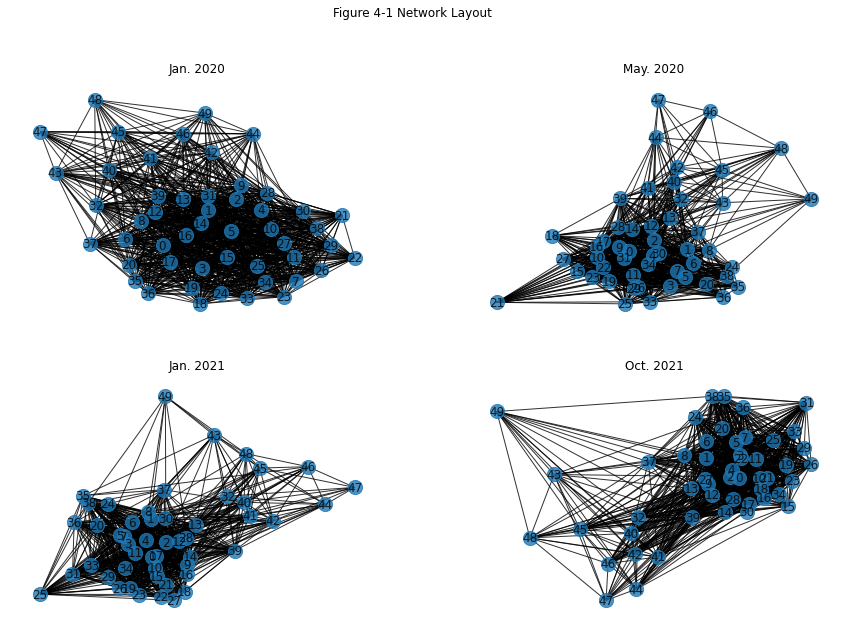

In [41]:
#%%Network layout 
fig = plt.figure(figsize = (15,10))
ax1 = plt.subplot(2,2,1)
pos1 = nx.spring_layout(G1) 
nx.draw(G1, pos1, with_labels=True, alpha=0.8, node_size=200)
plt.title('Jan. 2020')

ax2 = plt.subplot(2,2,2)
pos2 = nx.spring_layout(G2)  
nx.draw(G2, pos2, with_labels=True, alpha=0.8, node_size=200)
plt.title('May. 2020')

ax3 = plt.subplot(2,2,3)
pos3 = nx.spring_layout(G3)
nx.draw(G3, pos3, with_labels=True, alpha=0.8, node_size=200)
plt.title('Jan. 2021')

ax4 = plt.subplot(2,2,4)
pos4 = nx.spring_layout(G4)
nx.draw(G4, pos4, with_labels=True, alpha=0.8, node_size=200)
plt.title('Oct. 2021')

plt.suptitle('Figure 4-1 Network Layout')
plt.show()#top 50 airports
df_count = df['origin'].value_counts().rename_axis('origin').reset_index(name='counts')
df_50 = df[df['origin'].isin(df_count.head(50)['origin']) 
            & df['destination'].isin(df_count.head(50)['origin'])]
df_50 = df_50.iloc[:, 1:4]

It could be observed in Figure 4-1 that in the network of Jan. 2020, the clustering of the nodes is significant. With the pandemic in May.2020, the distribution of the nodes becomes relatively sparse, and the amount of edges is less, or in other words, the connectivity of the network decreases. In Jan. 2021 and Oct. 2021, the networks are still more like May. 2020 one. However, a recovery trend to the Jan. 2020 could be observed. The common specificity of the four networks is that the nodes with smaller numbers, which have more flights, are more clustered in the center approximately. 

### 4.2 Local network centrality indicators

In this subsection, the distribution of the local network centrality indicators for chosen months is shown.

####  4.2.1 Degree centrality

The degree centrality is the number of links that are directly connected to a node. The result is normalized by NetworkX in the range [0,1] and shown in figure 4-2 below.
It could be observed that firstly, the nodes with a high degree centrality(in the range [0.9,1] decreases a lot from Jan. 2020 to May. 2020. And then increases slightly in Jan. 2021 and Oct. 2021. 

Secondly, in Jan. 2020, the minimum degree centrality value is larger than 0.3, and in May. 2020, this value decreases to less than 0.2, and then slowly recovers to 0.3 in Oct. 2021.

These observations indicate that due to the pandemic, the number of links connecting different airports decreases, which means some flight routes were canceled, and the airports having more flight routes were affected the most.

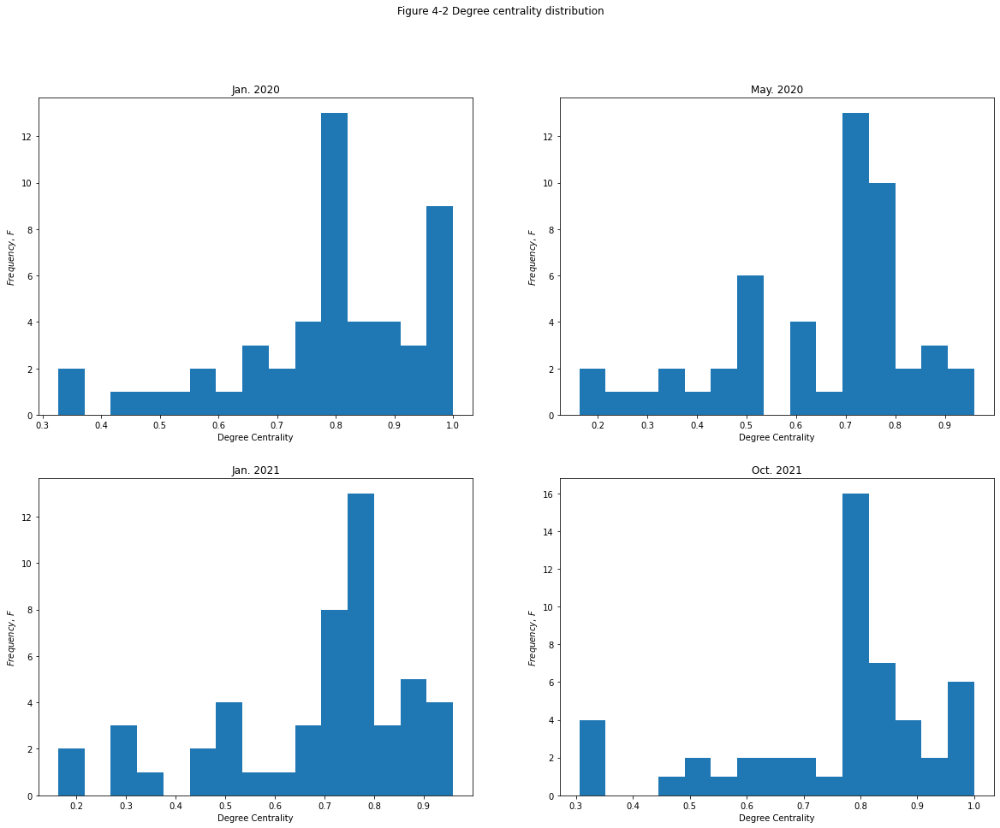

In [42]:
#degree_centrality
fig = plt.figure(figsize = (20,15))
ax1 = plt.subplot(2,2,1)
dc1 = nx.degree_centrality(G1)
plt.hist(dc1.values(), bins = 15)
plt.xlabel('Degree Centrality', fontsize = 10)
plt.ylabel('$Frequency, \, F$', fontsize = 10)
plt.title('Jan. 2020')

ax2 = plt.subplot(2,2,2)
dc2 = nx.degree_centrality(G2)
plt.hist(dc2.values(), bins = 15)
plt.xlabel('Degree Centrality', fontsize = 10)
plt.ylabel('$Frequency, \, F$', fontsize = 10)
plt.title('May. 2020')

ax3 = plt.subplot(2,2,3)
dc3 = nx.degree_centrality(G3)
plt.hist(dc3.values(), bins = 15)
plt.xlabel('Degree Centrality', fontsize = 10)
plt.ylabel('$Frequency, \, F$', fontsize = 10)
plt.title('Jan. 2021')

ax4 = plt.subplot(2,2,4)
dc4 = nx.degree_centrality(G4)
plt.hist(dc4.values(), bins = 15)
plt.xlabel('Degree Centrality', fontsize = 10)
plt.ylabel('$Frequency, \, F$', fontsize = 10)
plt.title('Oct. 2021')
plt.suptitle('Figure 4-2 Degree centrality distribution')
plt.show()

#### 4.2.2 Betweenness centrality
The betweenness centrality is shown in figure 4-3 below. It is the number/share of shortest paths between node j and k that traverse node/link I by definition. 

The distribution of the value is mostly near 0. This could indicate that most airports are directly connected, so not many transfers are needed. During the pandemic, the maximum value of the betweenness centrality increases from 0.014 to more than 0.3, and it becomes lower again in 2021. This indicates that during the pandemic, many flight routes are canceled, and the flight routes between big airports are kept. So some direct links between airports disappear, and then transfers are needed, which will make the betweenness centrality of the big airports larger.

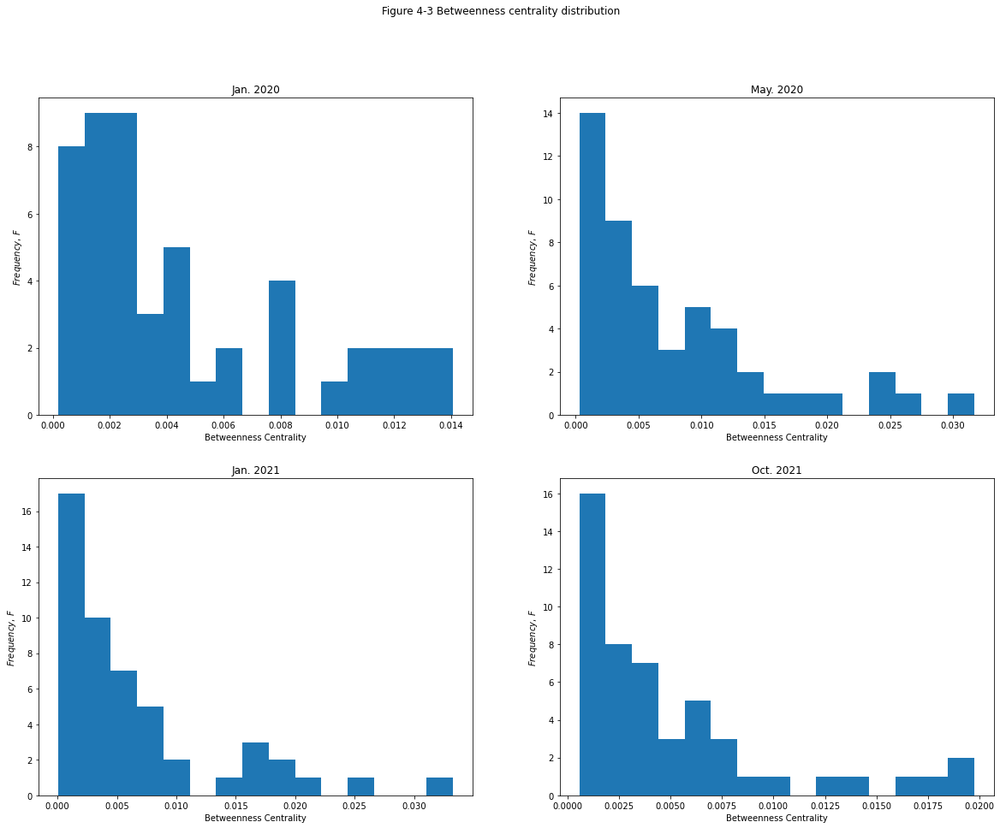

In [43]:
#%%betweenness_centrality
fig = plt.figure(figsize = (20,15))
ax1 = plt.subplot(2,2,1)
dc1 = nx.betweenness_centrality(G1)
plt.hist(dc1.values(), bins = 15)
plt.xlabel('Betweenness Centrality', fontsize = 10)
plt.ylabel('$Frequency, \, F$', fontsize = 10)
plt.title('Jan. 2020')
#plt.show()

ax2 = plt.subplot(2,2,2)
dc2 = nx.betweenness_centrality(G2)
plt.hist(dc2.values(), bins = 15)
plt.xlabel('Betweenness Centrality', fontsize = 10)
plt.ylabel('$Frequency, \, F$', fontsize = 10)
plt.title('May. 2020')

ax3 = plt.subplot(2,2,3)
dc3 = nx.betweenness_centrality(G3)
plt.hist(dc3.values(), bins = 15)
plt.xlabel('Betweenness Centrality', fontsize = 10)
plt.ylabel('$Frequency, \, F$', fontsize = 10)
plt.title('Jan. 2021')

ax4 = plt.subplot(2,2,4)
dc4 = nx.betweenness_centrality(G4)
plt.hist(dc4.values(), bins = 15)
plt.xlabel('Betweenness Centrality', fontsize = 10)
plt.ylabel('$Frequency, \, F$', fontsize = 10)
plt.title('Oct. 2021')
plt.suptitle('Figure 4-3 Betweenness centrality distribution')
plt.show()


#### 4.2.3 Monthly trend of the average of the indicators

The monthly node centrality indicators of the network is computed beforehand and save in 'NetworkCentrality.csv'. The code is saved in 'IndicatorsCalculation.ipynb'. The data is grouped by month, and the centrality indicators for each month are computed by NetworkX.

The figure 4-4 below shows the degree centrality and betweenness centrality of the global airport network from Oct.19 to Oct.21. 

First, by comparing the two curves, it could be observed that the degree centrality has a larger value than the betweenness centrality in general. 

Second, the degree centrality has a similar trend to the number of departing flights at airports during the research period. It reaches the expectation discussed in the previous section that due to the pandemic, some flight routes are canceled, which will cause a decrease in the degree centrality. 

To look into the monthly trend of betweenness centrality more in detail, it is shown alone in figure 4-5 below. It could be observed that when the flight number decreases from Apr. 2020 to Aug. 2020, the value of betweenness centrality increases, which fits the expectation.



In [44]:
fig = px.line(df_nc , x="Month", y="Value", color="Indicator")
fig.update_xaxes(title={'text': 'Time'})
fig.update_yaxes(title={'text': 'Network Indicators Value'})
fig.update_layout(title="Figure 4-4 Monthly trend of the average of the indicators")
fig.show()

In [45]:
fig = px.line(df_bc , x="Month", y="Value", color="Indicator")
fig.update_xaxes(title={'text': 'Time'})
fig.update_yaxes(title={'text': 'Network Indicators Value'})
fig.update_layout(title="Figure 4-5 Monthly trend of the average of the betweenness centrality")
fig.show()

In this section, by studying the network of global airports, it is found that the connectivity of the network and degree centrality decreases due to the pandemic, while the betweenness centrality increases. And a clear recovery trend could be found since Aug. 2020.

## 5. Conclusion and discussion

In conclusion, from Apr. 2020, the pandemic start to affect the global aviation network, and from Aug. 2020, a recovery trend could be observed. The number of departing flights, the connectivity of the network, and the degree centrality of the network are affected similarly by the pandemic, which decreased at the beginning of the pandemic and increased later, while the betweenness of the centrality has a diverse trend, which increased from the beginning of the pandemic and then decreased. 

Although the world is still under the influence of the pandemic, the indicators of most of the global airports are close to that in 2019 before the pandemic. It shows a positive trend that most countries have recovered to a normal situation.